In [ ]:
import time
from pathlib import Path
from operator import itemgetter

import scanpy as sc
import numpy as np
import pandas as pd
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from scipy.sparse import csr_matrix
from joblib import Parallel, delayed
import os
import torch

import stLVG_upload
from stLVG_upload.model import Cal_Spatial_Net, load_anndatas, run_SLAT_mlp_AGF, spatial_match, run_SLAT, compute_lisi_for_adata, run_SLAT_AGF_contrast
from stLVG_upload.viz import match_3D_multi, hist, Sankey, build_3D
from stLVG_upload.metrics import region_statistics


In [2]:
adata_1=sc.read_h5ad(r"D:\ppppaper\data\seqFISH\filtered_seqFish.h5ad")
adata_1.var_names_make_unique(join="++")
adata_1.obs['annotation'] = adata_1.obs['celltype_mapped_refined']
adata_1


AnnData object with n_obs × n_vars = 11529 × 351
    obs: 'z', 'uniqueID', 'x_global', 'y_global', 'embryo', 'Estage', 'x_global_affine', 'y_global_affine', 'UMAP1', 'UMAP2', 'cluster', 'celltype_mapped_refined', 'celltype_mapped', 'annotation'
    var: 'gene_names'
    obsm: 'spatial'

In [3]:
adata_2=sc.read_h5ad(r"D:\ppppaper\data\Stereo_seq\filtered_Stereoseq.h5ad")
adata_2.var_names_make_unique(join="++")
adata_2

AnnData object with n_obs × n_vars = 5031 × 25568
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'annotation', 'Regulon - 2310011J03Rik', 'Regulon - 5730507C01Rik', 'Regulon - Alx1', 'Regulon - Alx3', 'Regulon - Alx4', 'Regulon - Ar', 'Regulon - Arid3a', 'Regulon - Arid3c', 'Regulon - Arnt2', 'Regulon - Arx', 'Regulon - Ascl1', 'Regulon - Atf1', 'Regulon - Atf4', 'Regulon - Atf5', 'Regulon - Atf6', 'Regulon - Atf7', 'Regulon - Bach1', 'Regulon - Bach2', 'Regulon - Barhl1', 'Regulon - Barx1', 'Regulon - Batf', 'Regulon - Bcl11a', 'Regulon - Bcl3', 'Regulon - Bcl6', 'Regulon - Bcl6b', 'Regulon - Bclaf1', 'Regulon - Bdp1', 'Regulon - Bhlha15', 'Regulon - Bhlhe22', 'Regulon - Bhlhe23', 'Regulon - Bhlhe41', 'Regulon - Bmyc', 'Regulon - Boll', 'Regulon - Bptf', 'Regulon - Brca1', 'Regulon - Brf1', 'Regulon - Brf2', 'Regulon - Bsx', 'Regulon - Cdx1', 'Regulon - Cdx2', 'Regulon - Cebpa', 'Regulon - Cebpz', 'Regulon - Chd1', 'Regulon - Clock', 'Re

[<AxesSubplot: xlabel='spatial1', ylabel='spatial2'>]

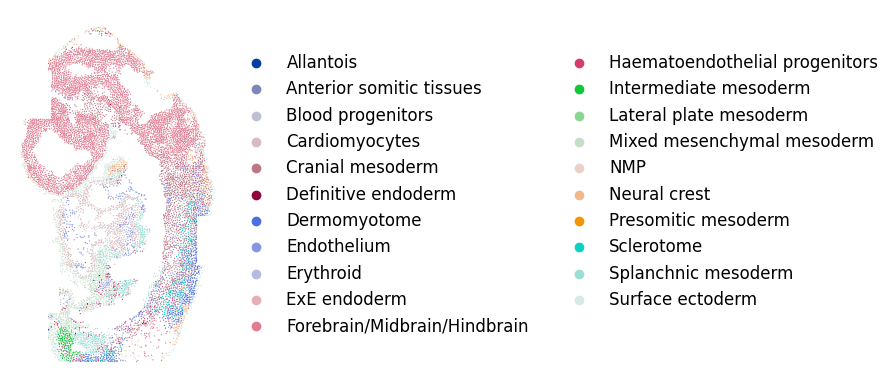

In [4]:
spot_size = 0.8
sc.pl.spatial(adata_1, img_key=None, color=['annotation'], title=[''],
              legend_fontsize=12, show=False, frameon=False, spot_size=spot_size)

[<AxesSubplot: xlabel='spatial1', ylabel='spatial2'>]

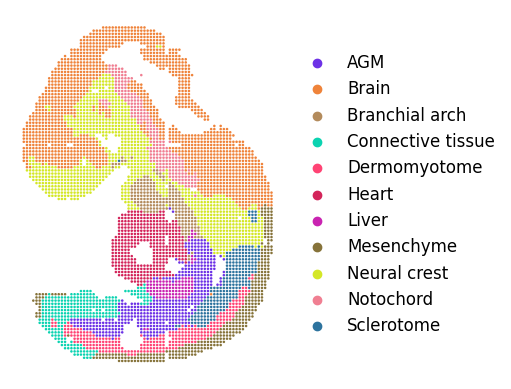

In [5]:
spot_size = 0.8
sc.pl.spatial(adata_2, img_key=None, color=['annotation'], title=[''],
              legend_fontsize=12, show=False, frameon=False, spot_size=spot_size)

In [6]:
x1_coords=adata_1.obsm['spatial'][:,0]
y1_coords=adata_1.obsm['spatial'][:,1]
x2_coords=adata_2.obsm['spatial'][:,0]
y2_coords=adata_2.obsm['spatial'][:,1]
locations_1 = np.array([x1_coords, y1_coords])
locations_2 = np.array([x2_coords, y2_coords])

locations_1_tensor = torch.tensor(locations_1)
locations_2_tensor = torch.tensor(locations_2)
locations_1_tensor = locations_1_tensor.transpose(0, 1)
locations_1_tensor = locations_1_tensor.to(dtype=torch.float32)
locations_2_tensor = locations_2_tensor.transpose(0, 1)
locations_2_tensor = locations_2_tensor.to(dtype=torch.float32)
location = [locations_1_tensor, locations_2_tensor]

In [7]:
Cal_Spatial_Net(adata_1, k_cutoff=50, model='KNN')
Cal_Spatial_Net(adata_2, k_cutoff=25, model='KNN')

Calculating spatial neighbor graph ...
The graph contains 642647 edges, 11529 cells.
55.741781594240614 neighbors per cell on average.
Calculating spatial neighbor graph ...
The graph contains 132251 edges, 5031 cells.
26.287219240707614 neighbors per cell on average.


In [8]:
edges, features = load_anndatas([adata_1, adata_2], feature='DPCA')

Use DPCA feature to format graph


d:\Anaconda\envs\scSLAT\lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actu

In [9]:
embd0_0, embd0_1, embd1_0, embd1_1, embd0, embd1, time = run_SLAT_AGF_contrast(features, edges, location, limit_loss=0.001)

GPU is not available
Running
---------- epochs: 1 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.03 s ----

---------- epochs: 2 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.04 s ----

---------- epochs: 3 ----------
---- Ran row_normalize in 0.08 s ----

---- Ran row_normalize in 0.02 s ----

---------- epochs: 4 ----------
---- Ran row_normalize in 0.06 s ----

---- Ran row_normalize in 0.03 s ----

---------- epochs: 5 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.04 s ----

---------- epochs: 6 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.02 s ----

---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.02 s ----

---------- epochs: 1 ----------
---- Ran row_normalize in 0.06 s ----



D:\ppppaper\SLAT\SLAT-main\SLAT-main\scSLAT\model\graphconv\AGF_Com.py:109: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\Copy.cpp:301.)
  complex_array_tensor = torch.tensor(complex_array, dtype=torch.float32)


---- Ran row_normalize in 0.03 s ----

---------- epochs: 2 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.03 s ----

---------- epochs: 3 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.03 s ----

---------- epochs: 4 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.05 s ----

---------- epochs: 5 ----------
---- Ran row_normalize in 0.08 s ----

---- Ran row_normalize in 0.03 s ----

---------- epochs: 6 ----------
---- Ran row_normalize in 0.07 s ----

---- Ran row_normalize in 0.03 s ----

---- Ran row_normalize in 0.08 s ----

---- Ran row_normalize in 0.04 s ----

---------- Combined epochs: 0 ----------
---------- Combined epochs: 1 ----------
---------- Combined epochs: 2 ----------
---------- Combined epochs: 3 ----------
---------- Combined epochs: 4 ----------
---------- Combined epochs: 5 ----------
---------- Combined epochs: 6 ----------
---------- Combined epochs: 7 ----------
-----

In [10]:
adata_1.obsm['stLVG'] = embd0.detach().cpu().numpy()
adata_2.obsm['stLVG'] = embd1.detach().cpu().numpy()

adata_com = sc.concat([adata_1, adata_2], label='slice_name', keys=['slice_1', 'slice_2'])

sc.pp.neighbors(adata_com, use_rep= 'stLVG')
sc.tl.umap(adata_com)


d:\Anaconda\envs\scSLAT\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


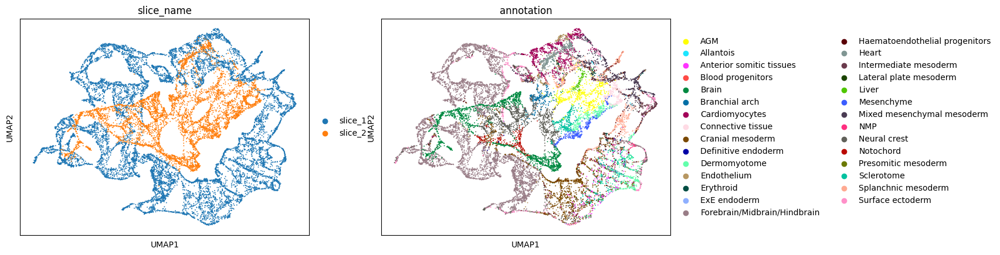

In [11]:
sc.pl.umap(adata_com, color= ['slice_name', 'annotation'])

In [12]:
embd2, embd3, time = run_SLAT(features, edges)

GPU is not available
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
Training model time: 57.29


In [13]:
adata_1.obsm['SLAT'] = embd2.detach().cpu().numpy()
adata_2.obsm['SLAT'] = embd3.detach().cpu().numpy()

adata_com_2 = sc.concat([adata_1,adata_2], label= 'slice_name', keys= ['slice_1','slice_2'])

sc.pp.neighbors(adata_com_2, use_rep= 'SLAT')
sc.tl.umap(adata_com_2)

d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
d:\Anaconda\envs\scSLAT\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


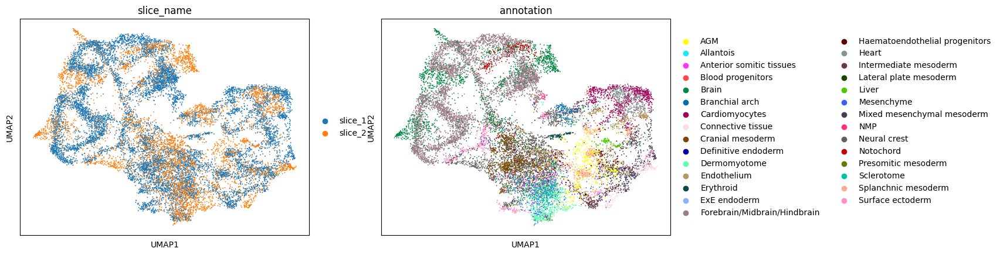

In [14]:
sc.pl.umap(adata_com_2, color= ['slice_name', 'annotation'])

In [15]:
# adata_1.obsm['X_dpca'] = features[0].numpy()
# adata_2.obsm['X_dpca'] = features[1].numpy()

In [16]:
# adata_1.write('./seqFISH_filter.h5ad')
# adata_2.write('./Stereo_seq_filter.h5ad')
# adata_com_2.write('./SLAT_embd.h5ad')

In [17]:

best, index, distance = spatial_match([embd0, embd1], adatas=[adata_1, adata_2])
adata1_df = pd.DataFrame({'index': range(embd0.shape[0]),
                        'x': adata_1.obsm['spatial'][:,0],
                        'y': adata_1.obsm['spatial'][:,1],
                        'celltype': adata_1.obs['annotation']})
adata2_df = pd.DataFrame({'index': range(embd1.shape[0]),
                        'x': adata_2.obsm['spatial'][:,0],
                        'y': adata_2.obsm['spatial'][:,1],
                        'celltype': adata_2.obs['annotation']})

matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]

0.400~0.450         0          0.000%
0.450~0.500         0          0.000%
0.500~0.550         0          0.000%
0.550~0.600         0          0.000%
0.600~0.650         3          0.060%
0.650~0.700        31          0.616%
0.700~0.750        42          0.835%
0.750~0.800       104          2.067%
0.800~0.850       273          5.426%
0.850~0.900       565         11.230%
0.900~0.950      1510         30.014%
0.950~1.000      2503         49.752%


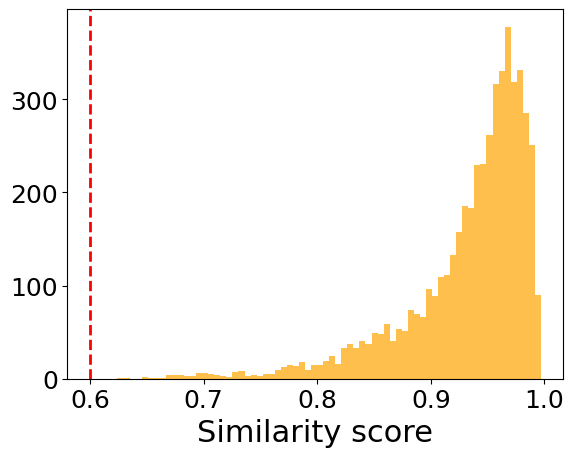

In [ ]:
import matplotlib.pyplot as plt
region_statistics(best_match, start=0.4, number_of_interval=12)
plt.rcParams['font.size'] = 18
cut = 0.6
plt.hist(best_match, bins=70, alpha=0.7, color='orange') 
plt.axvline(x=cut, color='r', linestyle='--', linewidth=2)


plt.xlabel('Similarity score', fontsize=22)
plt.ylabel('', fontsize=14)
plt.title('', fontsize=20)
plt.show()

In [19]:
best_2, index_2, distance_2 = spatial_match([embd2, embd3], adatas=[adata_1, adata_2])
adata3_df = pd.DataFrame({'index': range(embd2.shape[0]),
                        'x': adata_1.obsm['spatial'][:,0],
                        'y': adata_1.obsm['spatial'][:,1],
                        'celltype': adata_1.obs['annotation']})
adata4_df = pd.DataFrame({'index': range(embd3.shape[0]),
                        'x': adata_2.obsm['spatial'][:,0],
                        'y': adata_2.obsm['spatial'][:,1],
                        'celltype': adata_2.obs['annotation']})

matching_2 = np.array([range(index_2.shape[0]), best_2])
best_match_2 = distance_2[:,0]

0.400~0.450        62          1.232%
0.450~0.500       335          6.659%
0.500~0.550       631         12.542%
0.550~0.600       826         16.418%
0.600~0.650       928         18.446%
0.650~0.700       874         17.372%
0.700~0.750       748         14.868%
0.750~0.800       455          9.044%
0.800~0.850       153          3.041%
0.850~0.900        14          0.278%
0.900~0.950         0          0.000%
0.950~1.000         0          0.000%


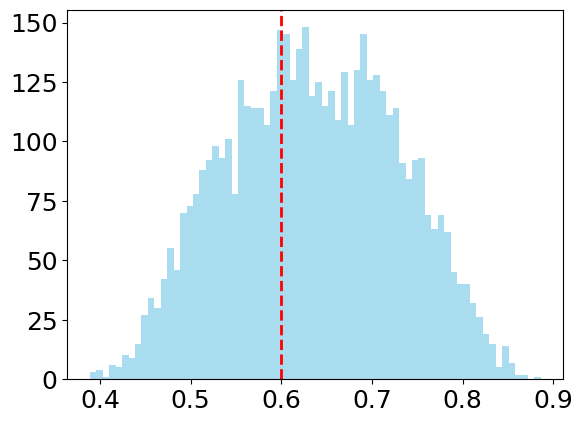

In [ ]:
region_statistics(best_match_2, start=0.4, number_of_interval=12)
plt.rcParams['font.size'] = 18
cut = 0.6
plt.hist(best_match_2, bins=70, alpha=0.7, color='skyblue') 

plt.axvline(x=cut, color='r', linestyle='--', linewidth=2)
plt.xlabel('', fontsize=14)
plt.ylabel('', fontsize=14)
# plt.title('Histogram with Cut-off', fontsize=)
plt.show()

In [30]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()
matching_table = adata2_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

In [31]:
adata4_df['target_celltype'] = adata3_df.iloc[matching_2[1,:],:]['celltype'].to_list()
matching_table_2 = adata4_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

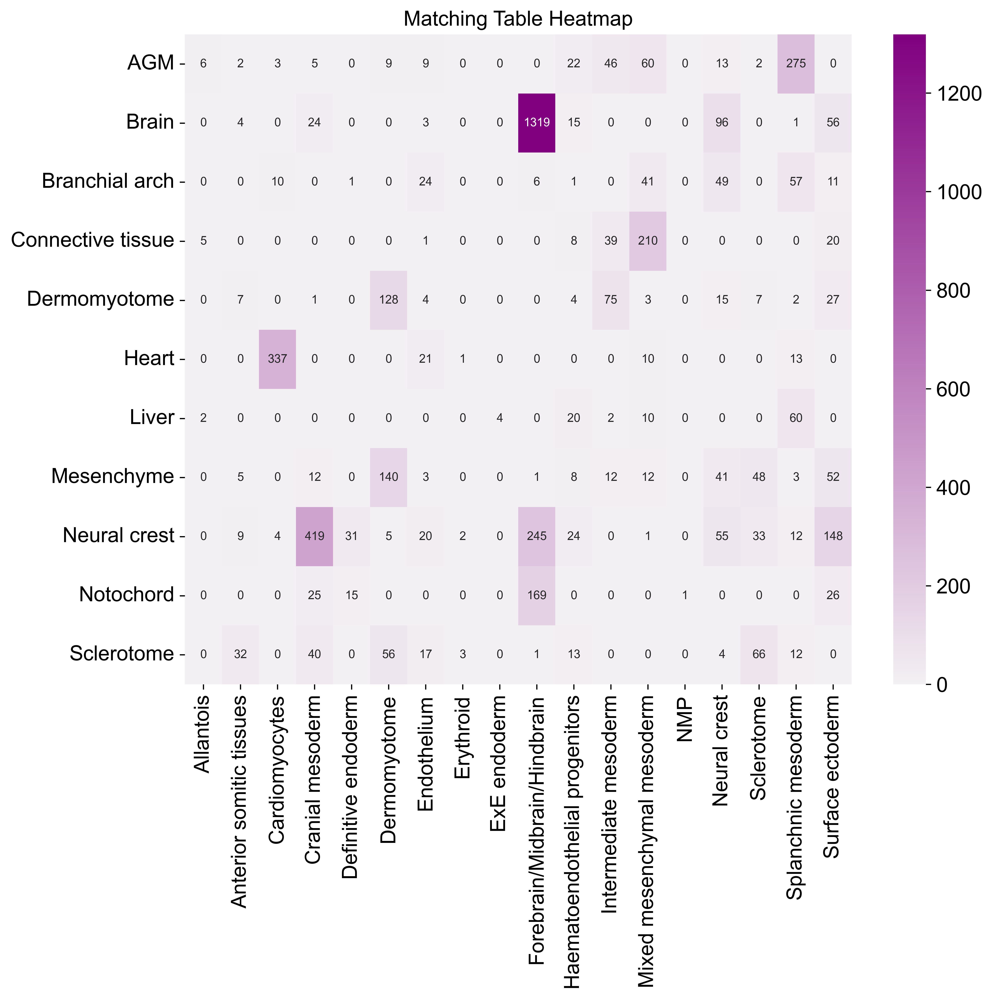

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt


sc.set_figure_params(dpi=300, dpi_save=300, transparent=True, facecolor=(1,1,1,1))
custom_cmap = sns.color_palette("light:purple", as_cmap=True)

plt.figure(figsize=(10, 8))  
sns.heatmap(matching_table, annot=True, fmt="d", cmap=custom_cmap, annot_kws={'fontsize': 8})  

plt.title('Matching Table Heatmap')
plt.xlabel('')
plt.ylabel('')
plt.show()

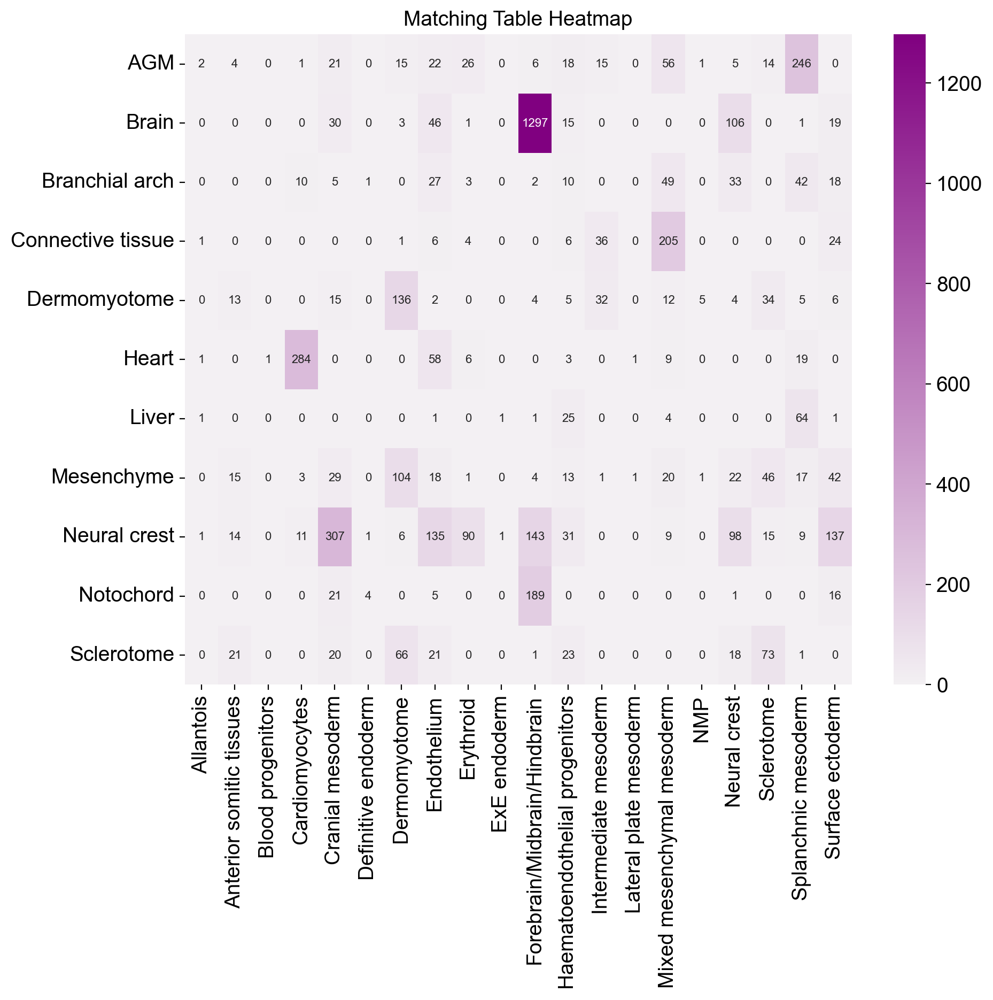

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt


sc.set_figure_params(dpi=100, dpi_save=100, transparent=True, facecolor=(1,1,1,1))
custom_cmap = sns.color_palette("light:purple", as_cmap=True)

plt.figure(figsize=(10, 8))  
sns.heatmap(matching_table_2, annot=True, fmt="d", cmap=custom_cmap, annot_kws={'fontsize': 8})  

plt.title('Matching Table Heatmap')
plt.xlabel('')
plt.ylabel('')
plt.show()

In [34]:
total_sum_1 = np.sum(matching_table)
print(total_sum_1)

target_celltype
Allantois                           13
Anterior somitic tissues            59
Cardiomyocytes                     354
Cranial mesoderm                   526
Definitive endoderm                 47
Dermomyotome                       338
Endothelium                        102
Erythroid                            6
ExE endoderm                         4
Forebrain/Midbrain/Hindbrain      1741
Haematoendothelial progenitors     115
Intermediate mesoderm              174
Mixed mesenchymal mesoderm         347
NMP                                  1
Neural crest                       273
Sclerotome                         156
Splanchnic mesoderm                435
Surface ectoderm                   340
dtype: int64


In [35]:
total_sum_2 = np.sum(matching_table_2)
print(total_sum_2)

target_celltype
Allantois                            6
Anterior somitic tissues            67
Blood progenitors                    1
Cardiomyocytes                     309
Cranial mesoderm                   448
Definitive endoderm                  6
Dermomyotome                       331
Endothelium                        341
Erythroid                          131
ExE endoderm                         2
Forebrain/Midbrain/Hindbrain      1647
Haematoendothelial progenitors     149
Intermediate mesoderm               84
Lateral plate mesoderm               2
Mixed mesenchymal mesoderm         364
NMP                                  7
Neural crest                       287
Sclerotome                         182
Splanchnic mesoderm                404
Surface ectoderm                   263
dtype: int64


In [36]:
sc.set_figure_params(dpi=300, dpi_save=300, transparent=True, facecolor=(1,1,1,1))

dataset1: 21 cell types; dataset2: 11 cell types; 
                    Total :29 celltypes; Overlap: 3 cell types 
                    Not overlap :[['Definitive endoderm', 'Erythroid', 'Cranial mesoderm', 'Lateral plate mesoderm', 'Blood progenitors', 'NMP', 'Haematoendothelial progenitors', 'ExE endoderm', 'Allantois', 'Splanchnic mesoderm', 'Forebrain/Midbrain/Hindbrain', 'Cardiomyocytes', 'Endothelium', 'Surface ectoderm', 'Anterior somitic tissues', 'Presomitic mesoderm', 'Intermediate mesoderm', 'Mixed mesenchymal mesoderm', 'Notochord', 'Connective tissue', 'AGM', 'Liver', 'Brain', 'Mesenchyme', 'Branchial arch', 'Heart']]
Subsampled 300 pairs from 5031


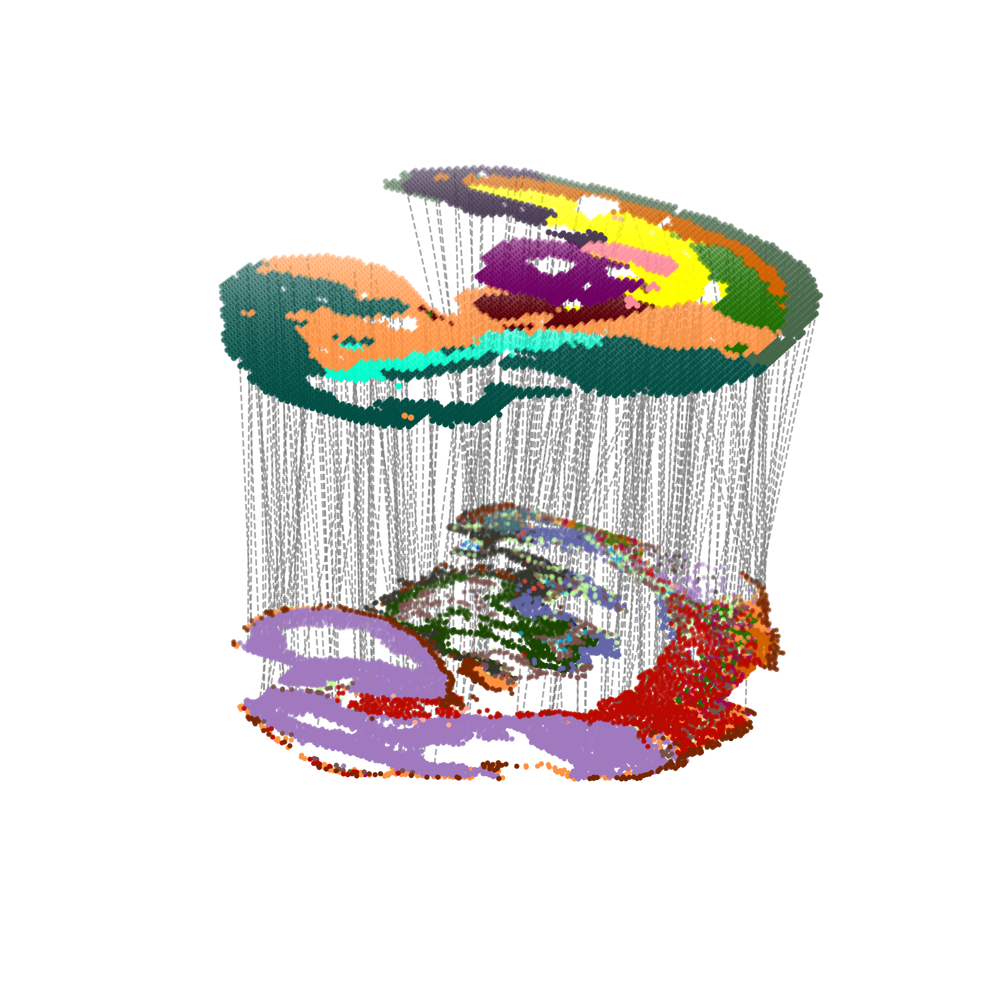

In [43]:
multi_align = match_3D_multi(adata1_df, adata2_df, matching, meta='celltype',
                             scale_coordinate=True, subsample_size=300, exchange_xy=False)

multi_align.draw_3D(size=[7, 8], line_width=0.7, line_color='grey', point_size=[1.25,2.5], 
                    hide_axis=True, show_error=False, save='./Alignment.png')

dataset1: 21 cell types; dataset2: 11 cell types; 
                    Total :29 celltypes; Overlap: 3 cell types 
                    Not overlap :[['Definitive endoderm', 'Erythroid', 'Cranial mesoderm', 'Lateral plate mesoderm', 'Blood progenitors', 'NMP', 'Haematoendothelial progenitors', 'ExE endoderm', 'Allantois', 'Splanchnic mesoderm', 'Forebrain/Midbrain/Hindbrain', 'Cardiomyocytes', 'Endothelium', 'Surface ectoderm', 'Anterior somitic tissues', 'Presomitic mesoderm', 'Intermediate mesoderm', 'Mixed mesenchymal mesoderm', 'Notochord', 'Connective tissue', 'AGM', 'Liver', 'Brain', 'Mesenchyme', 'Branchial arch', 'Heart']]
Subsampled 300 pairs from 5031


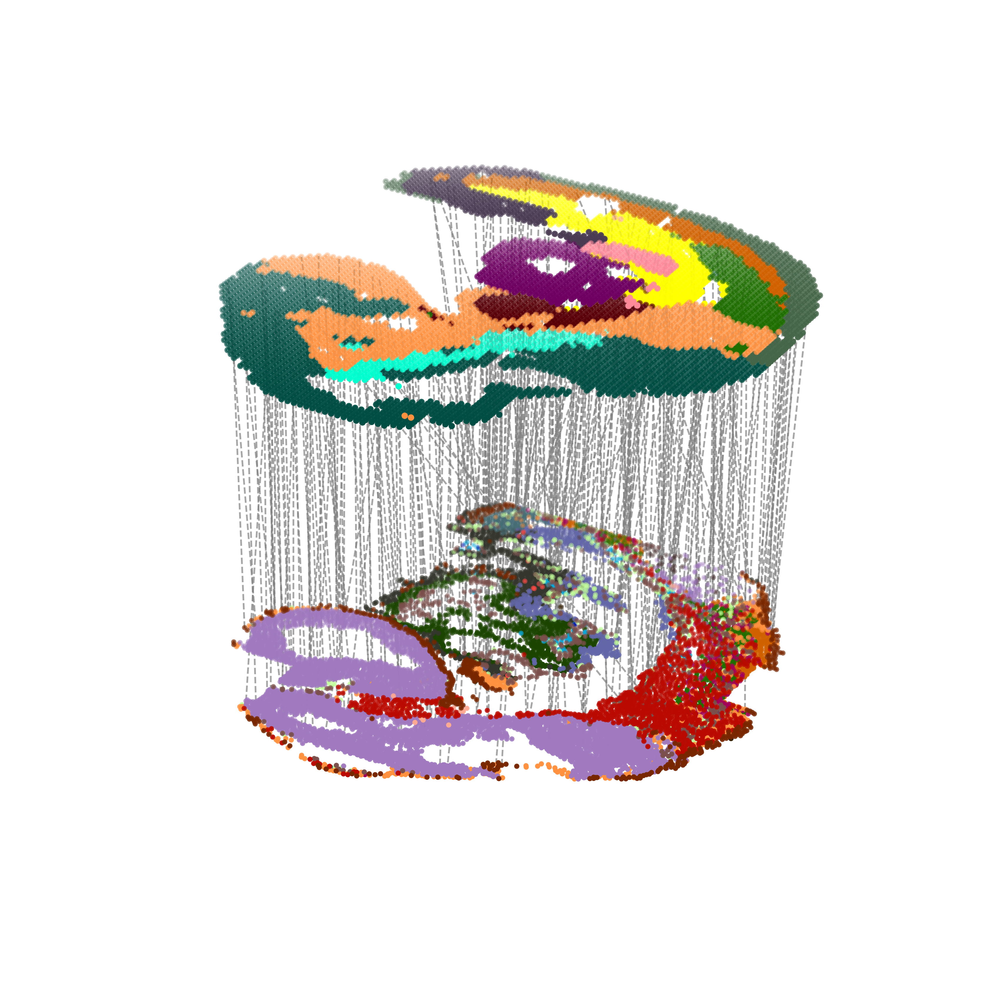

In [38]:
multi_align_2 = match_3D_multi(adata3_df, adata4_df, matching_2, meta='celltype',
                             scale_coordinate=True, subsample_size=300, exchange_xy=False)

multi_align_2.draw_3D(size=[7, 8], line_width=0.7, line_color='grey', point_size=[1.25,2.5], 
                    hide_axis=True, show_error=False, save='./Alignment_2.png')

In [60]:
Sankey(matching_table, prefix=['seqFISH', 'Stereo-seq'], filter_num=60, layout=[1600,900])

In [54]:
Sankey(matching_table_2, prefix=['seqFISH', 'Stereo-seq'], filter_num=60, layout=[1800,900])

In [44]:
# adata_1.write('D:\ppppaper\data\Result\seqFISH.h5ad')

In [ ]:
# adata_2.write('D:\ppppaper\data\Result\Stereo_seq.h5ad')